### "Momepy" Mesure des formes des bâtiments : l'exemple d'une partie du centre de Paris

##### Sami Ramzi Chibane © 

In [1]:
import momepy
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import osmnx as ox

In [2]:
point = (48.856737, 2.341585)
dist = 1000
gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
gdf_projected = ox.projection.project_gdf(gdf)
buildings = gdf_projected[gdf_projected.geom_type.isin(['Polygon', 'MultiPolygon'])]

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\geometries.py:798: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  for merged_inner_linestring in list(merged_inner_linestrings):
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\geometries.py:798: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for merged_inner_linestring in list(merged_inner_linestrings):
C:

In [3]:
buildings['uID'] = momepy.unique_id(buildings)
limit = momepy.buffered_limit(buildings)
tess = momepy.Tessellation(buildings, unique_id='uID', limit=limit)
tessellation = tess.tessellation

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Inward offset...
Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...


C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\momepy\elements.py:384: UserWarning: Tessellation does not fully match buildings. 11 element(s) collapsed during generation - unique_id: {4229, 4233, 4234, 4429, 1752, 1450, 6059, 4332, 4270, 4730, 3898}
  warnings.warn(
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\momepy\elements.py:395: UserWarning: Tessellation contains MultiPolygon elements. Initial objects should be edited. unique_id of affected elements: [6002, 4277, 5006, 5912, 4988, 5150, 5698, 2901, 4938, 3072, 5104, 325, 320, 5005, 6072, 5030, 5031, 5012, 765, 8]
  warnings.warn(


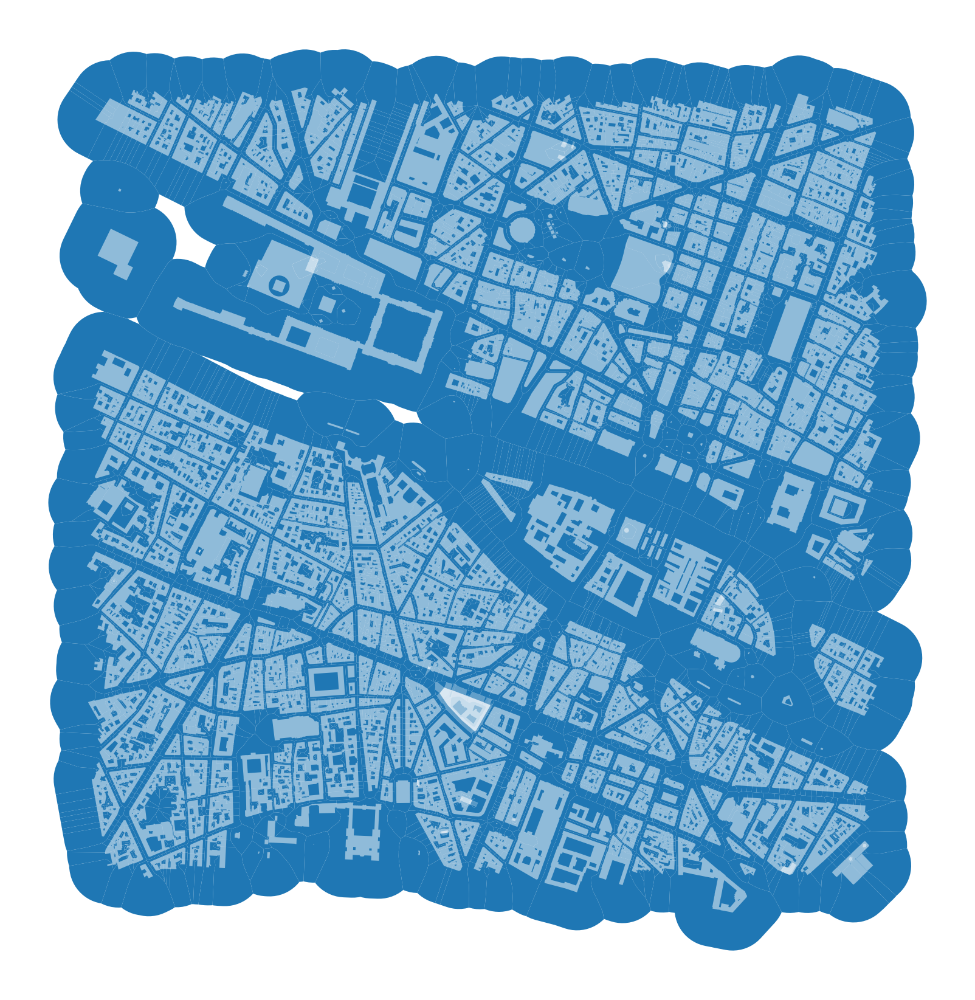

In [4]:
f, ax = plt.subplots(figsize=(30, 30))
tessellation.plot(ax=ax)
buildings.plot(ax=ax, color='white', alpha=.5)
ax.set_axis_off()
plt.show()

### 1. Building shapes

In [5]:
blg_cc = momepy.CircularCompactness(buildings)
buildings['circular_com'] = blg_cc.series

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


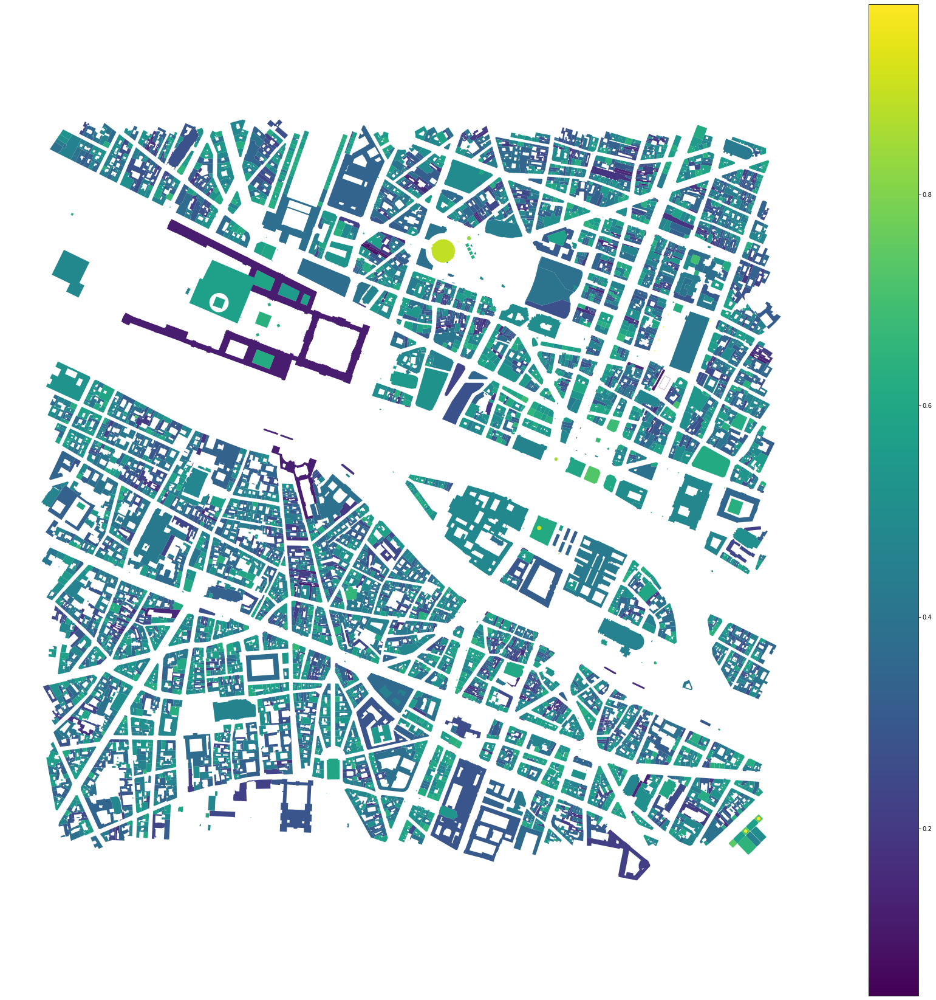

In [6]:
f, ax = plt.subplots(figsize=(30, 30))
buildings.plot(ax=ax, column='circular_com', legend=True, cmap='viridis')
ax.set_axis_off()
plt.show()

In [7]:
blg_area = momepy.Area(buildings)
buildings['area'] = blg_area.series

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


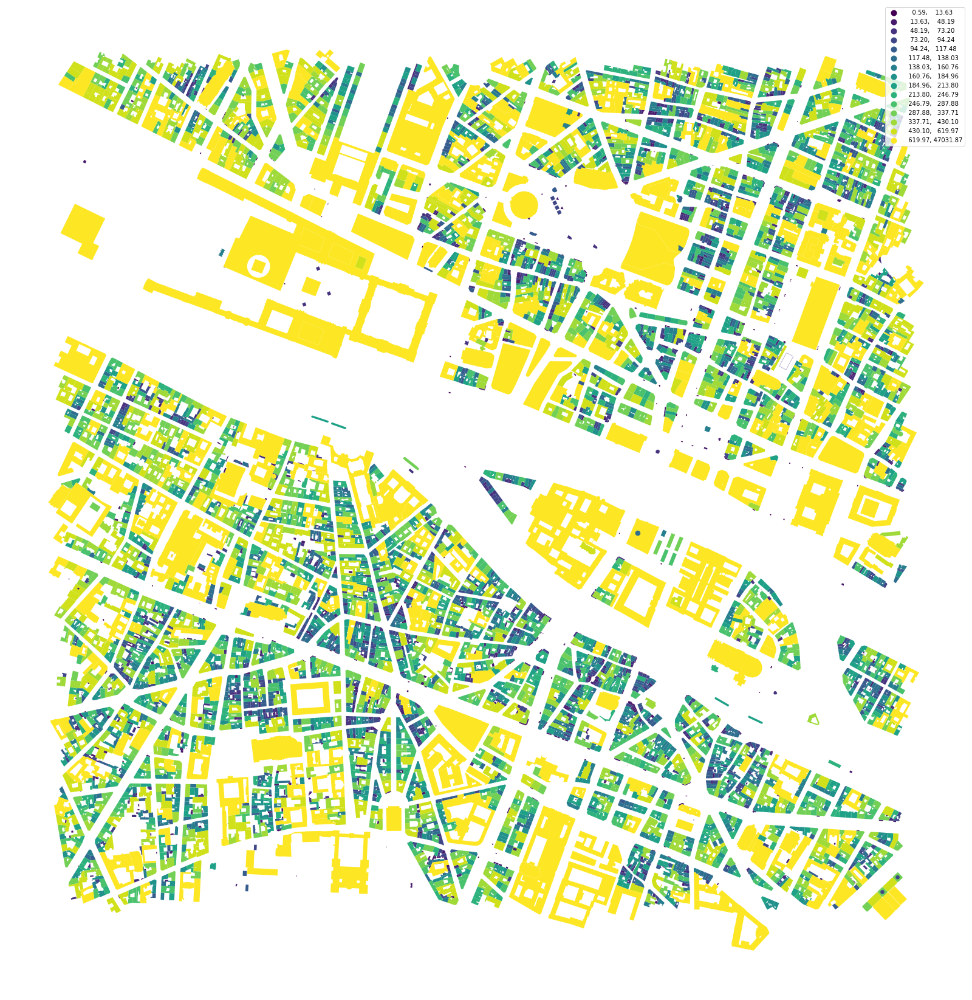

In [8]:
f, ax = plt.subplots(figsize=(30, 30))
buildings.plot(ax=ax, column='area', legend=True, scheme='quantiles', k=15, cmap='viridis')
ax.set_axis_off()
plt.show()

In [9]:
blg_elongation = momepy.Elongation(buildings)
buildings['elongation'] = blg_elongation.series

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


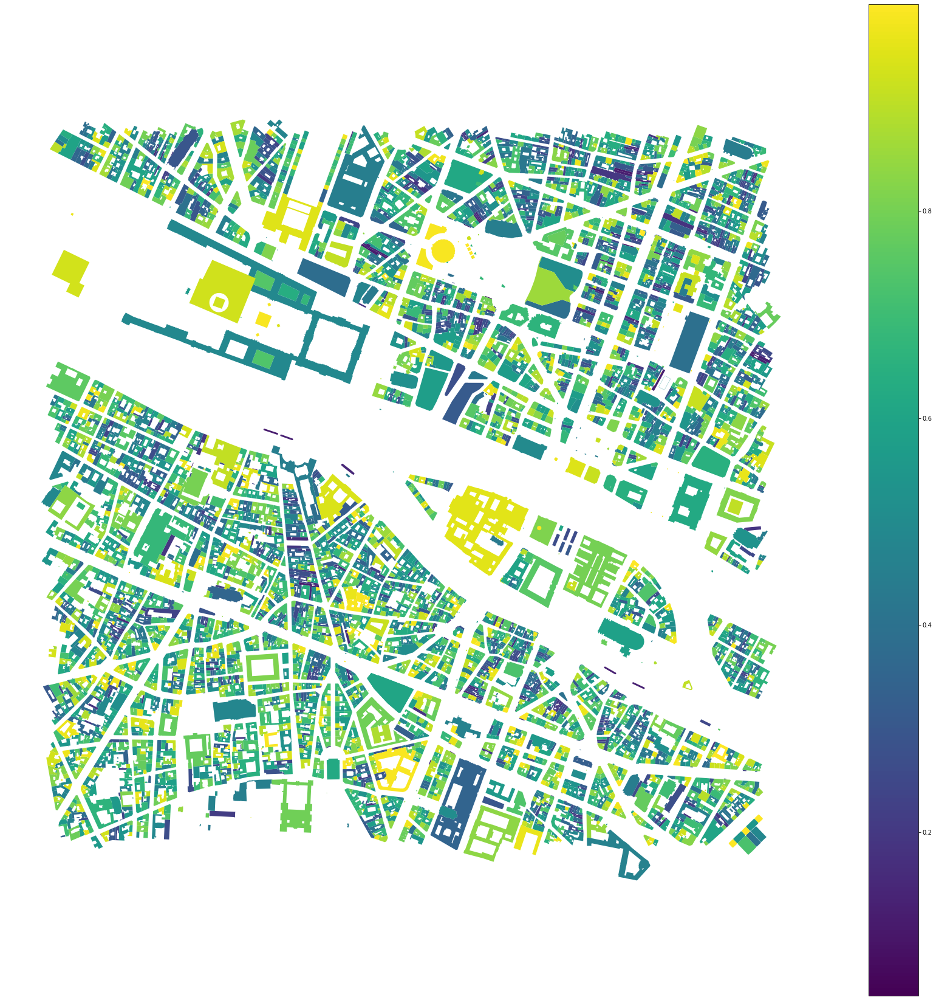

In [10]:
f, ax = plt.subplots(figsize=(30, 30))
buildings.plot(ax=ax, column='elongation', legend=True, cmap='viridis')
ax.set_axis_off()
plt.show()

In [11]:
blg_squareness = momepy.Squareness(buildings)
buildings['squareness'] = blg_squareness.series

  0%|          | 0/6075 [00:00<?, ?it/s]

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


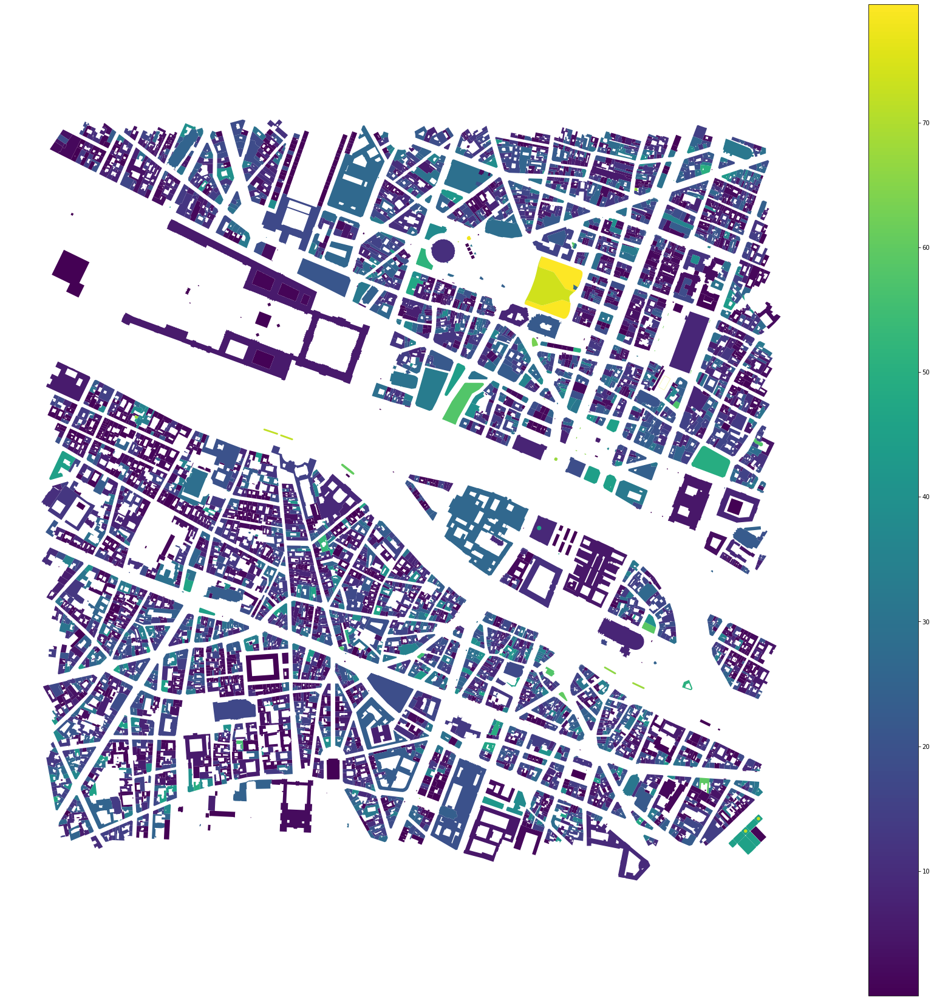

In [12]:
f, ax = plt.subplots(figsize=(30, 30))
buildings.plot(ax=ax, column='squareness', legend=True, cmap='viridis')
ax.set_axis_off()
plt.show()

In [13]:
tes_cwa = momepy.CompactnessWeightedAxis(tessellation)
tessellation['cwa'] = tes_cwa.series

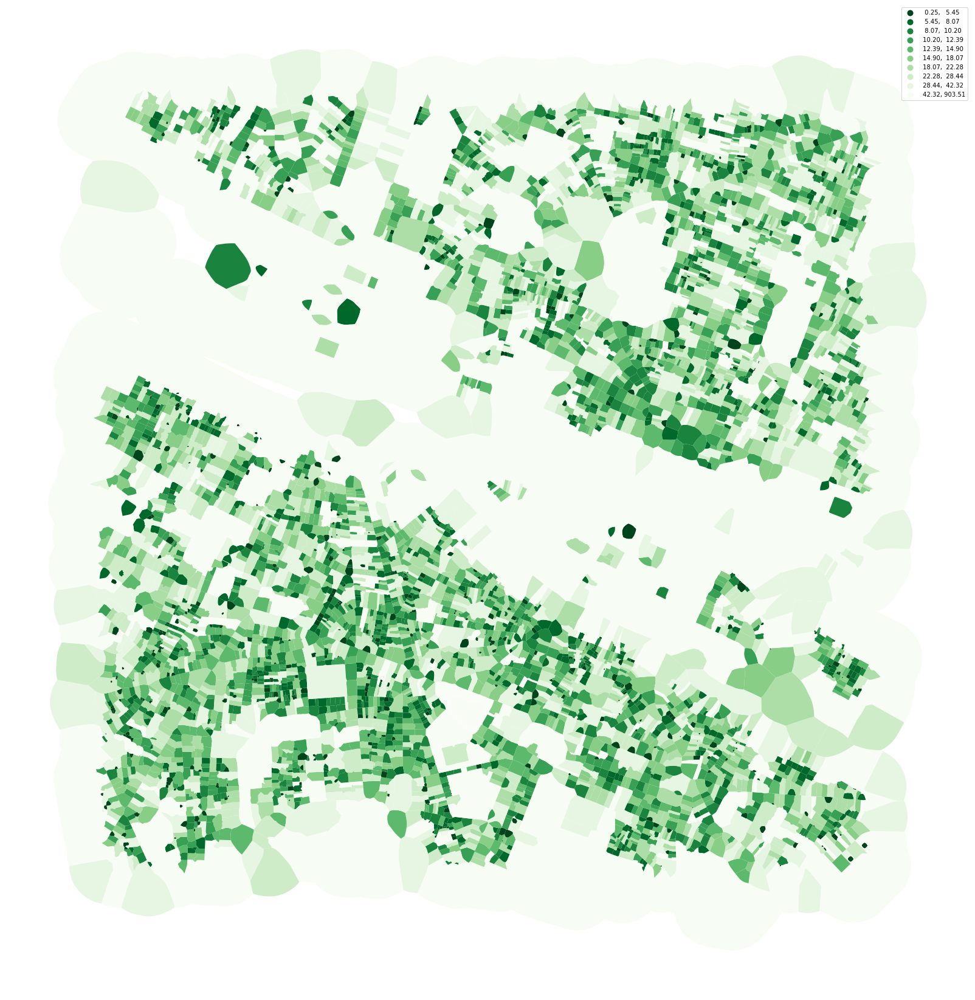

In [14]:
f, ax = plt.subplots(figsize=(30, 30))
tessellation.plot(ax=ax, column='cwa', legend=True, scheme='quantiles', k=10, cmap='Greens_r')
ax.set_axis_off()
plt.show()

In [15]:
place= 'Paris, France'
local_crs= 4275

In [16]:
osm_graph = ox.graph_from_place(place, network_type='walk')
osm_graph = ox.projection.project_graph(osm_graph, to_crs=local_crs)
streets = ox.graph_to_gdfs(
    osm_graph,
    nodes=False,
    edges=True,
    node_geometry=False,
    fill_edge_geometry=True
)

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


In [17]:
streets.head()

osmid                 name  \
u         v          key                                                
125730    268675130  0                 315818975  Rue Henri Duvernois   
          2841627108 0                  31093720    Rue Louis Lumière   
          244455548  0                  85735969    Rue Louis Lumière   
          1089076182 0    [266463585, 611974677]      Rue Louis Ganne   
268675130 125730     0                 315818975  Rue Henri Duvernois   

                              highway maxspeed  oneway   length  \
u         v          key                                          
125730    268675130  0    residential       30   False    8.707   
          2841627108 0    residential       30   False  128.700   
          244455548  0    residential       30   False  105.925   
          1089076182 0    residential       30   False  128.653   
268675130 125730     0    residential       30   False    8.707   

                                                                   geometry  \
u         v          key                                                      
125730    268675130  0      LINESTRING (2.41143 48.86359, 2.41154 48.86355)   
          2841627108 0    LINESTRING (2.41143 48.86359, 2.41117 48.86432...   
          244455548  0    LINESTRING (2.41143 48.86359, 2.41147 48.86344...   
          1089076182 0    LINESTRING (2.41143 48.86359, 2.41132 48.86358...   
268675130 125730     0      LINESTRING (2.41154 48.86355, 2.41143 48.86359)   

                         lanes junction  ref width access service tunnel  \
u         v          key                                                   
125730    268675130  0     NaN      NaN  NaN   NaN    NaN     NaN    NaN   
          2841627108 0       2      NaN  NaN   NaN    NaN     NaN    NaN   
          244455548  0       2      NaN  NaN   NaN    NaN     NaN    NaN   
          1089076182 0       2      NaN  NaN   NaN    NaN     NaN    NaN   
268675130 125730     0     NaN      NaN  NaN   NaN    NaN     NaN    NaN   

                         bridge est_width area  
u         v          key                        
125730    268675130  0      NaN       NaN  NaN  
          2841627108 0      NaN       NaN  NaN  
          244455548  0      NaN       NaN  NaN  
          1089076182 0      NaN       NaN  NaN  
268675130 125730     0      NaN       NaN  NaN

In [18]:
streets = momepy.remove_false_nodes(streets)
streets = streets[["geometry"]]
streets["nID"] = range(len(streets))

In [19]:
streets.head()

,geometry,nID
0,"LINESTRING (2.41143 48.86359, 2.41154 48.86355)",0
1,"LINESTRING (2.41143 48.86359, 2.41117 48.86432...",1
2,"LINESTRING (2.41143 48.86359, 2.41147 48.86344...",2
3,"LINESTRING (2.41143 48.86359, 2.41132 48.86358...",3
4,"LINESTRING (2.41154 48.86355, 2.41143 48.86359)",4


In [20]:
buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series
buildings['elongation'] = momepy.Elongation(buildings).series
tessellation['convexity'] = momepy.Convexity(tessellation).series
streets["linearity"] = momepy.Linearity(streets).series

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\momepy\shape.py:1286: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs

In [21]:
limit = momepy.buffered_limit(buildings, 100)

tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
tessellation = tessellation.tessellation

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\momepy\elements.py:384: UserWarning: Tessellation does not fully match buildings. 11 element(s) collapsed during generation - unique_id: {4229, 4233, 4234, 4429, 1752, 1450, 6059, 4332, 4270, 4730, 3898}
  warnings.warn(
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\momepy\elements.py:395: UserWarning: Tessellation contains MultiPolygon elements. Initial objects should be edited. unique_id of affected elements: [6002, 4277, 5006, 5912, 4988, 5150, 5698, 2901, 4938, 3072, 5104, 325, 320, 5005, 6072, 4895, 5031, 5012, 765, 8]
  warnings.warn(


#### Link streets

In [22]:
buildings = buildings.sjoin_nearest(streets, max_distance=1000, how="left")
buildings.head()

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:2050: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +proj=utm +zone=31 +ellps=WGS84 +datum=WGS84 +unit ...
Right CRS: EPSG:4275

  return geopandas.sjoin_nearest(
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\geopandas\array.py:341: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


,unique_id,osmid,element_type,addr:housenumber,geometry,seamark:type,source,addr:postcode,amenity,operator,...,language:brochures:zh,language:guides:fr,uID,circular_com,elongation,squareness,eri,index_right,nID,linearity
5,way/16077204,16077204,way,2,"POLYGON ((451143.211 5411126.790, 451144.686 5...",NaN,Cadastre;mise à jour : 2010;survey,NaN,place_of_worship,NaN,...,NaN,NaN,0,0.461893,0.480861,17.113599,0.897792,NaN,NaN,NaN
6,way/19740659,19740659,way,3,"POLYGON ((451981.911 5411235.839, 451981.258 5...",NaN,NaN,75005,place_of_worship,NaN,...,NaN,NaN,1,0.604390,0.729033,18.002521,0.948658,NaN,NaN,NaN
7,way/19741083,19741083,way,NaN,"POLYGON ((452095.959 5411228.712, 452095.706 5...",NaN,NaN,NaN,place_of_worship,NaN,...,NaN,NaN,2,0.517338,0.582354,58.054689,0.897260,NaN,NaN,NaN
8,way/19856722,19856722,way,NaN,"POLYGON ((451776.166 5412435.557, 451777.654 5...",NaN,NaN,NaN,NaN,Pinault Collection,...,NaN,NaN,3,0.891018,0.992242,10.758505,0.966180,NaN,NaN,NaN
9,way/20326709,20326709,way,NaN,"POLYGON ((452235.426 5411871.066, 452245.748 5...",NaN,data.gouv.fr:Ministère de la Culture - 08/2011,NaN,NaN,NaN,...,NaN,NaN,4,0.674180,0.920683,6.083382,0.976295,NaN,NaN,NaN


In [23]:
buildings = buildings.drop_duplicates("uID").drop(columns="index_right")
tessellation = tessellation.merge(buildings[['uID', 'nID']], on='uID', how='left')

In [24]:
buildings["area"] = buildings.area
tessellation["area"] = tessellation.area
streets["length"] = streets.length

C:\Users\Chibane\AppData\Local\Temp/ipykernel_80700/2740059750.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  streets["length"] = streets.length


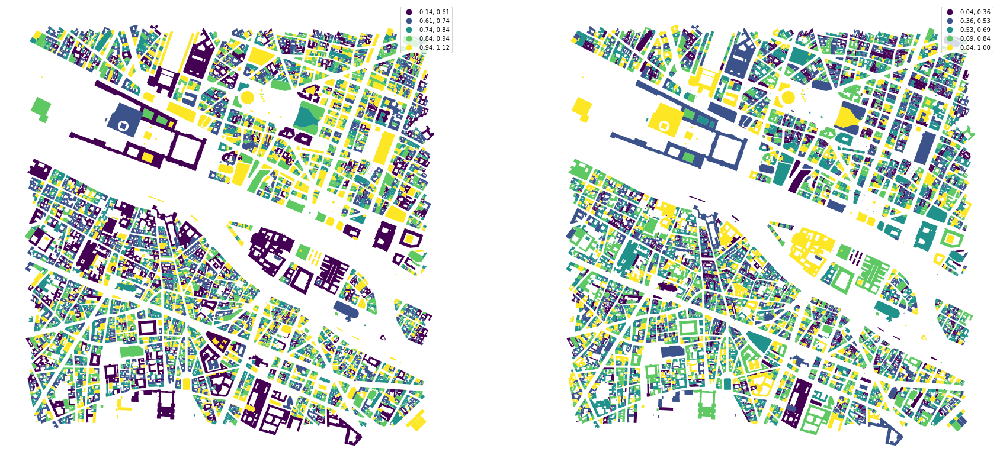

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(30, 30))

buildings.plot("eri", ax=ax[0], scheme="natural_breaks", legend=True)
buildings.plot("elongation", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

#### Spatial distribution

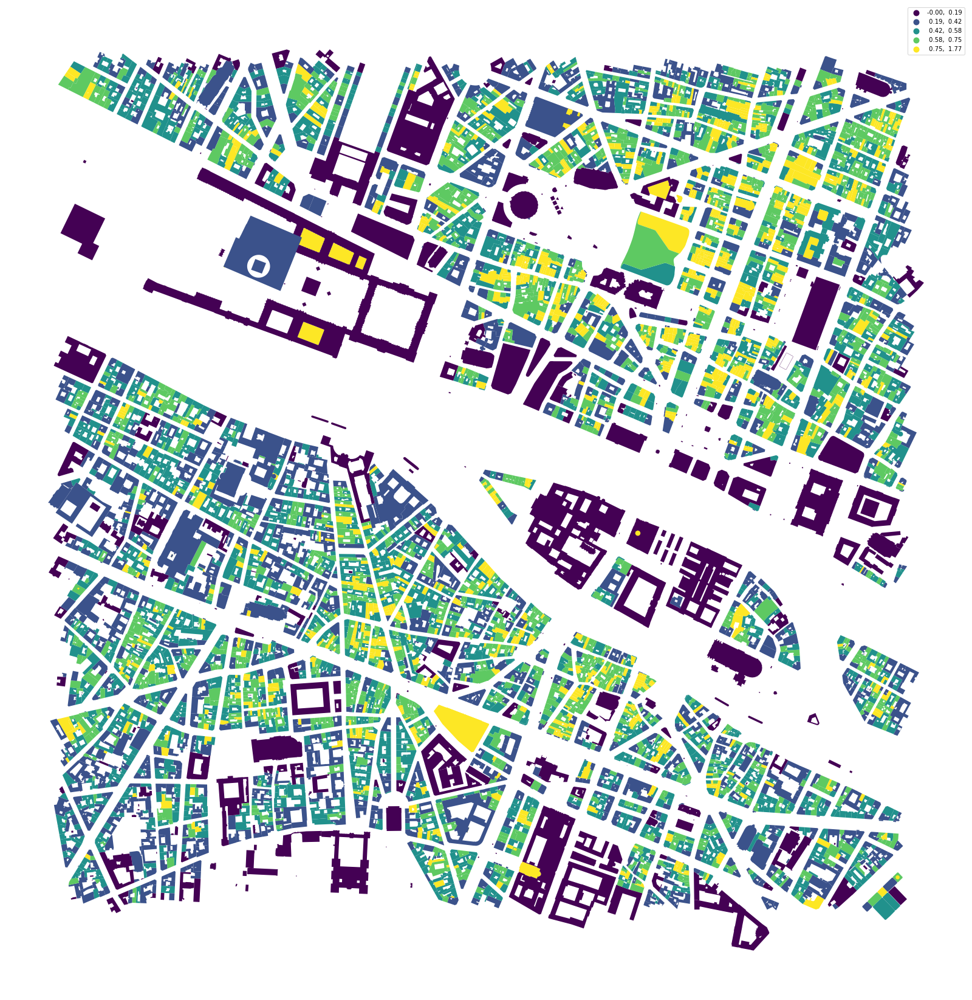

In [26]:
buildings["shared_walls"] = momepy.SharedWallsRatio(buildings).series
buildings.plot("shared_walls", figsize=(30, 30), scheme="natural_breaks", legend=True).set_axis_off()

#### Generate spatial weights matrix using libpysal

In [27]:
import libpysal
import warnings

In [28]:
queen_1 = libpysal.weights.contiguity.Queen.from_dataframe(tessellation, ids="uID", silence_warnings=True)

In [29]:
tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    buildings["neighbor_distance"] = momepy.NeighborDistance(buildings, queen_1, "uID", verbose=False).series

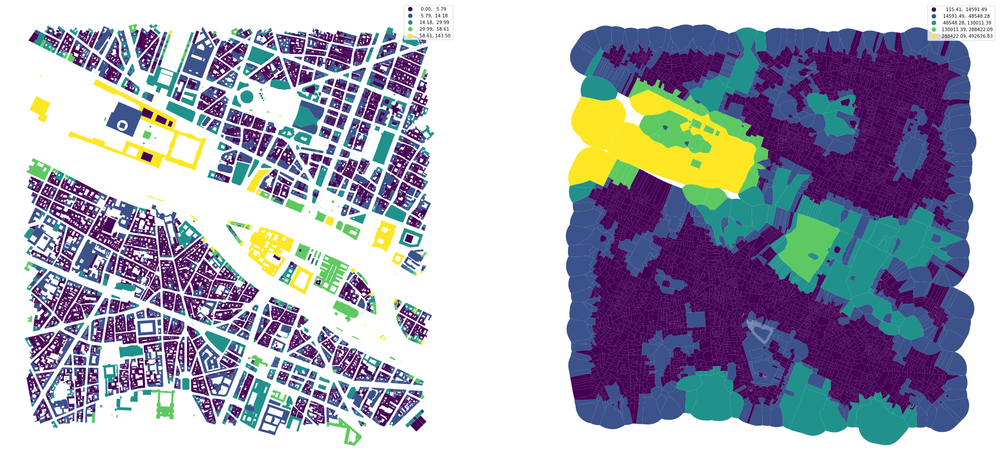

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(40, 30))

buildings.plot("neighbor_distance", ax=ax[0], scheme="natural_breaks", legend=True)
tessellation.plot("covered_area", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

In [32]:
queen_3 = momepy.sw_high(k=3, weights=queen_1)
buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)

buildings['interbuilding_distance'] = momepy.MeanInterbuildingDistance(buildings, queen_1, 'uID', queen_3, verbose=False).series
buildings['adjacency'] = momepy.BuildingAdjacency(buildings, queen_3, 'uID', buildings_q1, verbose=False).series

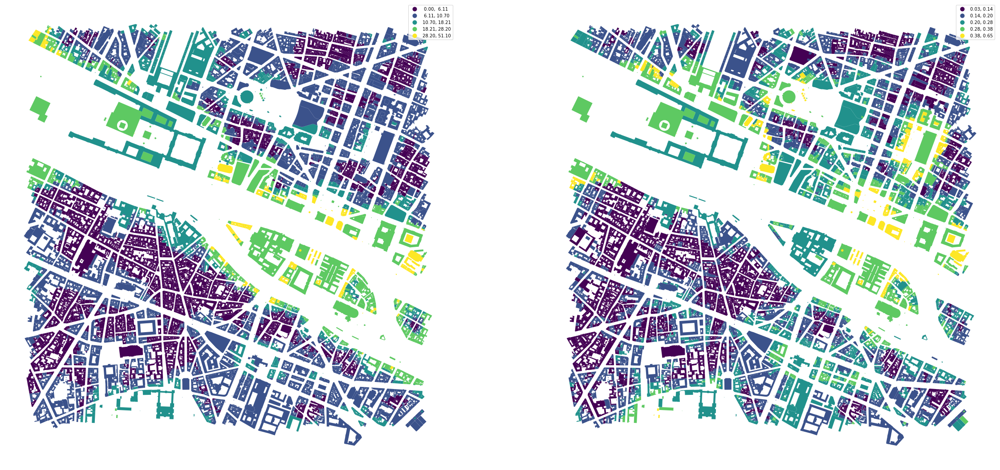

In [33]:
fig, ax = plt.subplots(1, 2, figsize=(40, 30))

buildings.plot("interbuilding_distance", ax=ax[0], scheme="natural_breaks", legend=True)
buildings.plot("adjacency", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

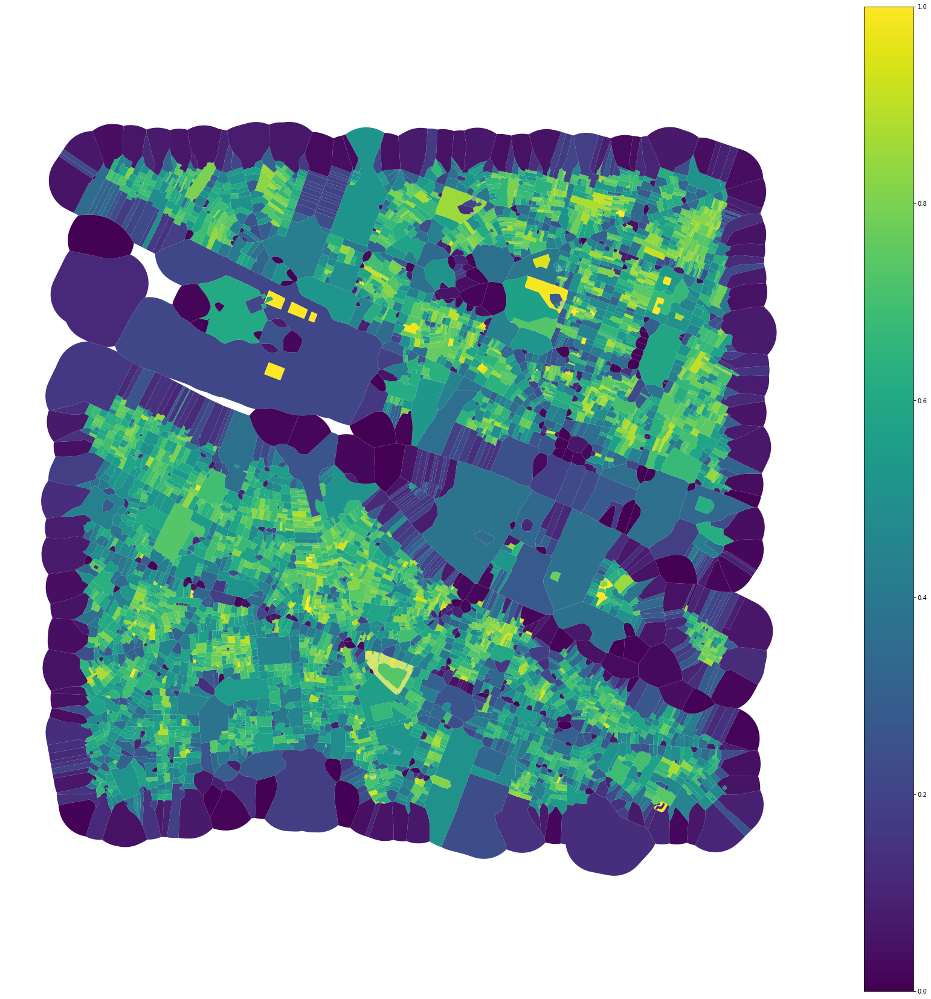

In [34]:
tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series
tessellation.plot("car", figsize=(30, 30), vmin=0, vmax=1, legend=True).set_axis_off()

#### Connectivity

In [ ]:
graph = momepy.gdf_to_nx(streets)
graph = momepy.node_degree(graph)
graph = momepy.closeness_centrality(graph, radius=400, distance="mm_len")
graph = momepy.meshedness(graph, radius=400, distance="mm_len")
nodes, streets = momepy.nx_to_gdf(graph)

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(40, 30))

nodes.plot("degree", ax=ax[0], scheme="natural_breaks", legend=True, markersize=1)
nodes.plot("closeness", ax=ax[1], scheme="natural_breaks", legend=True, markersize=1, legend_kwds={"fmt": "{:.6f}"})
nodes.plot("meshedness", ax=ax[2], scheme="natural_breaks", legend=True, markersize=1)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

In [ ]:
buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")

In [ ]:
tessellation.head()

In [ ]:
merged = tessellation.merge(buildings.drop(columns=['nID', 'geometry']), on='uID')
merged = merged.merge(streets.drop(columns='geometry'), on='nID', how='left')
merged = merged.merge(nodes.drop(columns='geometry'), on='nodeID', how='left')

In [ ]:
merged.columns

In [ ]:
percentiles = []
for column in merged.columns.drop(["uID", "nodeID", "nID", 'mm_len', 'node_start', 'node_end', "geometry"]):
    perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
    perc.columns = [f"{column}_" + str(x) for x in perc.columns]
    percentiles.append(perc)

In [ ]:
percentiles_joined = pandas.concat(percentiles, axis=1)
percentiles_joined.head()

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
merged.plot(percentiles_joined['convexity_50'].values, ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_axis_off()
ax[1].set_axis_off()

In [ ]:
#### Clustering

In [ ]:
standardized = (percentiles_joined - percentiles_joined.mean()) / percentiles_joined.std()
standardized.head()

In [ ]:
cgram = Clustergram(range(1, 12), n_init=10, random_state=42)
cgram.fit(standardized.fillna(0))

show(cgram.bokeh())

In [ ]:
cgram.labels.head()

In [ ]:
merged["cluster"] = cgram.labels[8].values
urban_types = buildings[["geometry", "uID"]].merge(merged[["uID", "cluster"]], on="uID")
urban_types.plot("cluster", categorical=True, figsize=(16, 16), legend=True).set_axis_off()

In [ ]:
ax = urban_types.plot("cluster", categorical=True, figsize=(16, 16), legend=True)
ax.set_xlim(-645000, -641000)
ax.set_ylim(-1195500, -1191000)
ax.set_axis_off()